In [3]:
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import numpy as np
import re

In [4]:
# Create function to find null values
def find_null_values(df):
    for column in df.columns:
        if df[column].isnull().sum() > 0:
            print(f'Column {column} has {df[column].isnull().sum()} null values')

In [5]:
# Create function to remove state abbreviation after city name
def remove_state_abbv(df):
    df['RegionName'] = [re.sub("(.*),.*", "\\1", str(x)) for x in df['RegionName']]

## Home Value Forecast Data


In [6]:
file_path1 = 'Resources/Zillow_HVF.csv'
hvf_df = pd.read_csv(file_path1, skiprows=[1])
hvf_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,BaseDate,2022-07-31,2022-09-30,2023-06-30
0,394913,1,"New York, NY",Msa,NY,2022-06-30,0.8,2.2,4.8
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,2022-06-30,0.0,1.0,5.3
2,394463,3,"Chicago, IL",Msa,IL,2022-06-30,0.9,2.6,5.1
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,2022-06-30,1.3,4.1,10.8
4,394974,5,"Philadelphia, PA",Msa,PA,2022-06-30,1.0,2.6,6.2


In [7]:
hvf_df.dtypes

RegionID        int64
SizeRank        int64
RegionName     object
RegionType     object
StateName      object
BaseDate       object
2022-07-31    float64
2022-09-30    float64
2023-06-30    float64
dtype: object

In [8]:
hvf_df.describe()

,RegionID,SizeRank,2022-07-31,2022-09-30,2023-06-30
count,911.000000,911.000000,906.000000,908.000000,911.000000
mean,415271.058178,459.346872,1.073620,3.110573,7.164874
std,83362.123219,267.460151,0.556726,1.113354,2.718895
min,394297.000000,1.000000,-1.400000,-1.800000,-6.400000
25%,394547.500000,228.500000,0.800000,2.400000,5.400000
50%,394803.000000,456.000000,1.100000,3.000000,6.900000
75%,395050.500000,687.500000,1.400000,3.800000,8.800000
max,753929.000000,933.000000,4.500000,10.200000,16.700000


In [9]:
# Remove state abbreviation after city name
remove_state_abbv(hvf_df)
hvf_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,BaseDate,2022-07-31,2022-09-30,2023-06-30
0,394913,1,New York,Msa,NY,2022-06-30,0.8,2.2,4.8
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,2022-06-30,0.0,1.0,5.3
2,394463,3,Chicago,Msa,IL,2022-06-30,0.9,2.6,5.1
3,394514,4,Dallas-Fort Worth,Msa,TX,2022-06-30,1.3,4.1,10.8
4,394974,5,Philadelphia,Msa,PA,2022-06-30,1.0,2.6,6.2


In [10]:
find_null_values(hvf_df)

Column 2022-07-31 has 5 null values
Column 2022-09-30 has 3 null values


In [11]:
hvf_df.dropna().reset_index(drop=True)
hvf_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,BaseDate,2022-07-31,2022-09-30,2023-06-30
0,394913,1,New York,Msa,NY,2022-06-30,0.8,2.2,4.8
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,2022-06-30,0.0,1.0,5.3
2,394463,3,Chicago,Msa,IL,2022-06-30,0.9,2.6,5.1
3,394514,4,Dallas-Fort Worth,Msa,TX,2022-06-30,1.3,4.1,10.8
4,394974,5,Philadelphia,Msa,PA,2022-06-30,1.0,2.6,6.2


In [12]:
# Drop Columns to clean up dataframe
hvf_data = hvf_df.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'BaseDate'])
hvf_data.head()

,RegionName,StateName,2022-07-31,2022-09-30,2023-06-30
0,New York,NY,0.8,2.2,4.8
1,Los Angeles-Long Beach-Anaheim,CA,0.0,1.0,5.3
2,Chicago,IL,0.9,2.6,5.1
3,Dallas-Fort Worth,TX,1.3,4.1,10.8
4,Philadelphia,PA,1.0,2.6,6.2


## Home Value Index Data


In [13]:
file_path2 = 'Resources/Zillow_HVI.csv'
hvi_df = pd.read_csv(file_path2, skiprows=[1])
hvi_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,"New York, NY",Msa,NY,225516.0,226863.0,228076.0,230462.0,232684.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,231193.0,231998.0,233231.0,235575.0,238089.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,"Chicago, IL",Msa,IL,171271.0,171675.0,172198.0,173245.0,174354.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,131555.0,131660.0,131748.0,131961.0,132186.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,"Philadelphia, PA",Msa,PA,130664.0,131102.0,131365.0,132019.0,132548.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [14]:
hvi_df.describe()

,RegionID,SizeRank,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,2000-06-30,2000-07-31,2000-08-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
count,907.000000,907.000000,441.000000,442.000000,443.000000,445.000000,447.000000,448.000000,449.000000,450.000000,...,9.050000e+02,9.030000e+02,9.050000e+02,9.000000e+02,9.040000e+02,9.040000e+02,9.050000e+02,9.070000e+02,9.070000e+02,9.070000e+02
mean,415362.621830,458.314223,111778.011338,112093.617647,112331.101580,113175.939326,114006.814318,114535.830357,115242.314031,115922.871111,...,2.352768e+05,2.383079e+05,2.409995e+05,2.443872e+05,2.486014e+05,2.528947e+05,2.561354e+05,2.595221e+05,2.624475e+05,2.654158e+05
std,83534.501875,267.468546,53431.111974,53609.993189,53867.527434,54778.562436,55545.817953,56324.784252,57081.485879,57925.516627,...,1.586404e+05,1.613494e+05,1.635983e+05,1.664305e+05,1.691907e+05,1.724755e+05,1.760918e+05,1.797084e+05,1.826319e+05,1.842372e+05
min,394297.000000,1.000000,34637.000000,34540.000000,34582.000000,34548.000000,34685.000000,34784.000000,34899.000000,34965.000000,...,3.163800e+04,3.171700e+04,3.167000e+04,3.225600e+04,3.296500e+04,3.399400e+04,3.447800e+04,3.490800e+04,3.507500e+04,3.540200e+04
25%,394549.500000,227.500000,76892.000000,77166.500000,77393.000000,77814.000000,78188.500000,78469.000000,78814.000000,79088.250000,...,1.405830e+05,1.414260e+05,1.425110e+05,1.440908e+05,1.470575e+05,1.497798e+05,1.508700e+05,1.526525e+05,1.543845e+05,1.563580e+05
50%,394805.000000,454.000000,99932.000000,100481.500000,100350.000000,100898.000000,101454.000000,101819.000000,102328.000000,103034.000000,...,1.865140e+05,1.873400e+05,1.895890e+05,1.920675e+05,1.950420e+05,1.977215e+05,1.997510e+05,2.017630e+05,2.048510e+05,2.077100e+05
75%,395052.000000,686.500000,130664.000000,130645.750000,130591.000000,131259.000000,131808.500000,132394.000000,133053.000000,133386.250000,...,2.826970e+05,2.854000e+05,2.876470e+05,2.907185e+05,2.942508e+05,3.011140e+05,3.041230e+05,3.065625e+05,3.089795e+05,3.131065e+05
max,753929.000000,933.000000,434391.000000,436998.000000,440726.000000,451363.000000,461553.000000,473641.000000,482975.000000,495355.000000,...,1.495619e+06,1.504507e+06,1.519156e+06,1.539982e+06,1.568421e+06,1.606876e+06,1.646124e+06,1.682233e+06,1.692646e+06,1.679555e+06


In [15]:
# find null values
find_null_values(hvi_df)

Column 2000-01-31 has 466 null values
Column 2000-02-29 has 465 null values
Column 2000-03-31 has 464 null values
Column 2000-04-30 has 462 null values
Column 2000-05-31 has 460 null values
Column 2000-06-30 has 459 null values
Column 2000-07-31 has 458 null values
Column 2000-08-31 has 457 null values
Column 2000-09-30 has 456 null values
Column 2000-10-31 has 456 null values
Column 2000-11-30 has 453 null values
Column 2000-12-31 has 452 null values
Column 2001-01-31 has 444 null values
Column 2001-02-28 has 444 null values
Column 2001-03-31 has 444 null values
Column 2001-04-30 has 442 null values
Column 2001-05-31 has 441 null values
Column 2001-06-30 has 440 null values
Column 2001-07-31 has 439 null values
Column 2001-08-31 has 439 null values
Column 2001-09-30 has 439 null values
Column 2001-10-31 has 438 null values
Column 2001-11-30 has 437 null values
Column 2001-12-31 has 436 null values
Column 2002-01-31 has 435 null values
Column 2002-02-28 has 435 null values
Column 2002-

In [16]:
# Remove state abbreviation after city name
remove_state_abbv(hvi_df)

In [17]:
hvi_df.head(10)

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,225516.0,226863.0,228076.0,230462.0,232684.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,231193.0,231998.0,233231.0,235575.0,238089.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,Chicago,Msa,IL,171271.0,171675.0,172198.0,173245.0,174354.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,Dallas-Fort Worth,Msa,TX,131555.0,131660.0,131748.0,131961.0,132186.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,Philadelphia,Msa,PA,130664.0,131102.0,131365.0,132019.0,132548.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0
5,394692,6,Houston,Msa,TX,126519.0,126597.0,126478.0,126596.0,126604.0,...,270390.0,274697.0,277870.0,281297.0,284760.0,289080.0,294445.0,300457.0,306044.0,310239.0
6,395209,7,Washington,Msa,DC,193180.0,193427.0,193806.0,194612.0,195732.0,...,520427.0,523310.0,526230.0,529647.0,533439.0,538507.0,544142.0,549575.0,553983.0,556296.0
7,394856,8,Miami-Fort Lauderdale,Msa,FL,125671.0,126134.0,126548.0,127364.0,128034.0,...,371434.0,379642.0,387320.0,394586.0,402632.0,410239.0,420478.0,431182.0,444697.0,456489.0
8,394347,9,Atlanta,Msa,GA,154331.0,154844.0,155373.0,156442.0,157487.0,...,316952.0,324392.0,331958.0,339799.0,347293.0,354110.0,361285.0,368733.0,375982.0,381361.0
9,394404,10,Boston,Msa,MA,234051.0,235356.0,236623.0,238847.0,241059.0,...,604952.0,609550.0,613899.0,618764.0,624260.0,631495.0,639975.0,649831.0,657835.0,663494.0


In [18]:
# Get column dates from last two years only
hvi_new = hvi_df[hvi_df.columns[np.concatenate([range(0,5),range(250,275)])]]
hvi_new

,RegionID,SizeRank,RegionName,RegionType,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,488763.0,489984.0,492585.0,497110.0,502622.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,690755.0,692496.0,701667.0,712282.0,722246.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,Chicago,Msa,IL,244909.0,245927.0,247603.0,250506.0,253382.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,Dallas-Fort Worth,Msa,TX,263317.0,264380.0,266755.0,269375.0,272502.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,Philadelphia,Msa,PA,257611.0,259242.0,261868.0,265047.0,268749.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,394767,929,Lamesa,Msa,TX,79276.0,79396.0,79483.0,79737.0,80109.0,...,90901.0,91860.0,92441.0,94055.0,95700.0,97936.0,99128.0,100176.0,101259.0,102796.0
903,753874,930,Craig,Msa,CO,203800.0,203694.0,204158.0,204861.0,205863.0,...,240977.0,243967.0,245587.0,249005.0,251980.0,254360.0,254611.0,254762.0,255699.0,259578.0
904,394968,931,Pecos,Msa,TX,135199.0,136440.0,136826.0,138264.0,138420.0,...,165382.0,170185.0,171244.0,174065.0,176831.0,179332.0,181149.0,183894.0,186876.0,190000.0
905,395188,932,Vernon,Msa,TX,72385.0,72403.0,72365.0,72487.0,72491.0,...,79200.0,79551.0,79838.0,81980.0,84202.0,86827.0,87516.0,88168.0,88454.0,89621.0


In [19]:
# Drop columns to clean up dataframe
hvi_data = hvi_new.drop(columns=['RegionID', 'SizeRank', 'RegionType']).reset_index(drop=True)
hvi_data.head()

,RegionName,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,488763.0,489984.0,492585.0,497110.0,502622.0,508677.0,514528.0,519394.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,Los Angeles-Long Beach-Anaheim,CA,690755.0,692496.0,701667.0,712282.0,722246.0,729736.0,736072.0,741208.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,Chicago,IL,244909.0,245927.0,247603.0,250506.0,253382.0,256202.0,258442.0,259983.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,Dallas-Fort Worth,TX,263317.0,264380.0,266755.0,269375.0,272502.0,274906.0,277528.0,279871.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,Philadelphia,PA,257611.0,259242.0,261868.0,265047.0,268749.0,272289.0,275992.0,279242.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [20]:
hvi_data = hvi_data.dropna().reset_index(drop=True)
hvi_data.head()

,RegionName,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,488763.0,489984.0,492585.0,497110.0,502622.0,508677.0,514528.0,519394.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,Los Angeles-Long Beach-Anaheim,CA,690755.0,692496.0,701667.0,712282.0,722246.0,729736.0,736072.0,741208.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,Chicago,IL,244909.0,245927.0,247603.0,250506.0,253382.0,256202.0,258442.0,259983.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,Dallas-Fort Worth,TX,263317.0,264380.0,266755.0,269375.0,272502.0,274906.0,277528.0,279871.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,Philadelphia,PA,257611.0,259242.0,261868.0,265047.0,268749.0,272289.0,275992.0,279242.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [21]:
# add date column labels to list to use in fixing rent dataframe column labels
labels = (hvi_data.columns[2:].values.tolist())
print(labels)

['2020-06-30', '2020-07-31', '2020-08-31', '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30', '2022-05-31', '2022-06-30']


In [22]:
# Reorder data to have all the dates in one column
hvi_by_month = hvi_data.melt(id_vars=['RegionName', 'StateName'],
                                          var_name='Date',
                                          value_name='HVI')
hvi_by_month.head()

,RegionName,StateName,Date,HVI
0,New York,NY,2020-06-30,488763.0
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,690755.0
2,Chicago,IL,2020-06-30,244909.0
3,Dallas-Fort Worth,TX,2020-06-30,263317.0
4,Philadelphia,PA,2020-06-30,257611.0


In [23]:
# Rename RegionName and StateName columns
hvi_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
hvi_by_month.head()

,City,State,Date,HVI
0,New York,NY,2020-06-30,488763.0
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,690755.0
2,Chicago,IL,2020-06-30,244909.0
3,Dallas-Fort Worth,TX,2020-06-30,263317.0
4,Philadelphia,PA,2020-06-30,257611.0


In [24]:
# Reorder DataFrames so Date column is first
hvi_by_month = hvi_by_month[['Date', 'City', 'State', 'HVI']]
hvi_by_month.head()

,Date,City,State,HVI
0,2020-06-30,New York,NY,488763.0
1,2020-06-30,Los Angeles-Long Beach-Anaheim,CA,690755.0
2,2020-06-30,Chicago,IL,244909.0
3,2020-06-30,Dallas-Fort Worth,TX,263317.0
4,2020-06-30,Philadelphia,PA,257611.0


In [25]:
# Get the monthly percentage of change for HVI for each city
hvi_by_month['%Change_HVI'] = hvi_by_month.groupby(['City', 'State'])['HVI'].pct_change().mul(100).round(2)
hvi_by_month

,Date,City,State,HVI,%Change_HVI
0,2020-06-30,New York,NY,488763.0,NaN
1,2020-06-30,Los Angeles-Long Beach-Anaheim,CA,690755.0,NaN
2,2020-06-30,Chicago,IL,244909.0,NaN
3,2020-06-30,Dallas-Fort Worth,TX,263317.0,NaN
4,2020-06-30,Philadelphia,PA,257611.0,NaN
...,...,...,...,...,...
16620,2022-06-30,Andrews,TX,221347.0,1.44
16621,2022-06-30,Zapata,TX,117079.0,0.85
16622,2022-06-30,Vermillion,SD,231123.0,1.12
16623,2022-06-30,Pecos,TX,190000.0,1.67


In [26]:
hvi_data = hvi_by_month.dropna().reset_index(drop=True)
hvi_data

,Date,City,State,HVI,%Change_HVI
0,2020-07-31,New York,NY,489984.0,0.25
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,692496.0,0.25
2,2020-07-31,Chicago,IL,245927.0,0.42
3,2020-07-31,Dallas-Fort Worth,TX,264380.0,0.40
4,2020-07-31,Philadelphia,PA,259242.0,0.63
...,...,...,...,...,...
15955,2022-06-30,Andrews,TX,221347.0,1.44
15956,2022-06-30,Zapata,TX,117079.0,0.85
15957,2022-06-30,Vermillion,SD,231123.0,1.12
15958,2022-06-30,Pecos,TX,190000.0,1.67


In [27]:
hvi_data['State'].unique()

array(['NY', 'CA', 'IL', 'TX', 'PA', 'DC', 'FL', 'GA', 'MA', 'MI', 'AZ',
       'WA', 'MN', 'MO', 'MD', 'CO', 'OR', 'NC', 'OH', 'NV', 'IN', 'VA',
       'TN', 'RI', 'WI', 'OK', 'KY', 'CT', 'LA', 'AL', 'UT', 'HI', 'NM',
       'NE', 'SC', 'AR', 'KS', 'ID', 'IA', 'MS', 'ME', 'NH', 'AK', 'DE',
       'NJ', 'WV', 'SD', 'VT', 'ND', 'MT', 'WY'], dtype=object)

In [28]:
#output_path = 'Resources/hvi_data.csv'
#hvi_data.to_csv(output_path, index=False)

## Rent Index Data


In [29]:
file_path3 = 'Resources/Zillow_Rent_Index.csv'
rent_df = pd.read_csv(file_path3, skiprows=[1])
rent_df.head()

,RegionID,RegionName,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,394913,"New York, NY",1,2306.0,2335,2342.0,2348,2382,2400,2418,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,753899,"Los Angeles-Long Beach-Anaheim, CA",2,1815.0,1846,1833.0,1842,1865,1885,1903,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,394463,"Chicago, IL",3,1464.0,1477,1478.0,1483,1499,1514,1522,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,394514,"Dallas-Fort Worth, TX",4,1105.0,1130,1136.0,1152,1147,1150,1155,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,394974,"Philadelphia, PA",5,1350.0,1316,1337.0,1340,1349,1360,1365,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [30]:
# Split RegionName column into City and State Columns and drop RegionName
rent_df.dropna(inplace=True)
new = rent_df['RegionName'].str.split(', ', n=1, expand=True)
rent_df['City'] = new[0]
rent_df['State'] = new[1]
rent_df.drop(columns=['RegionName'], inplace=True)

rent_df

,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,...,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06,City,State
0,394913,1,2306.0,2335,2342.0,2348,2382,2400,2418,2426,...,2852,2884,2917,2970,3019,3072,3135,3186,New York,NY
1,753899,2,1815.0,1846,1833.0,1842,1865,1885,1903,1918,...,2759,2781,2801,2834,2863,2900,2935,2951,Los Angeles-Long Beach-Anaheim,CA
2,394463,3,1464.0,1477,1478.0,1483,1499,1514,1522,1525,...,1818,1832,1846,1860,1883,1907,1931,1947,Chicago,IL
3,394514,4,1105.0,1130,1136.0,1152,1147,1150,1155,1157,...,1700,1710,1719,1735,1744,1771,1802,1825,Dallas-Fort Worth,TX
4,394974,5,1350.0,1316,1337.0,1340,1349,1360,1365,1370,...,1766,1788,1784,1794,1808,1821,1838,1852,Philadelphia,PA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,394602,159,1237.0,1270,1260.0,1267,1273,1275,1285,1281,...,1757,1776,1773,1797,1811,1825,1855,1874,Fort Collins,CO
104,394405,162,1456.0,1489,1456.0,1443,1457,1492,1505,1514,...,2080,2104,2131,2147,2185,2206,2219,2221,Boulder,CO
105,394483,192,984.0,1026,1005.0,1017,1021,1031,1034,1038,...,1296,1310,1318,1333,1346,1353,1354,1356,College Station,TX
106,394623,229,883.0,922,936.0,928,930,934,926,933,...,1561,1583,1600,1605,1615,1606,1627,1652,Gainesville,GA


In [31]:
rent_df.dtypes

RegionID      int64
SizeRank      int64
2014-01     float64
2014-02       int64
2014-03     float64
             ...   
2022-04       int64
2022-05       int64
2022-06       int64
City         object
State        object
Length: 106, dtype: object

In [32]:
rent_df['State'].unique()

array(['NY', 'CA', 'IL', 'TX', 'PA', 'DC', 'FL', 'GA', 'MA', 'MI', 'AZ',
       'WA', 'MN', 'MO', 'MD', 'CO', 'OR', 'NC', 'OH', 'NV', 'IN', 'VA',
       'TN', 'RI', 'OK', 'KY', 'CT', 'LA', 'AL', 'UT', 'HI', 'NM', 'NE',
       'SC', 'AR', 'ID', 'WI', 'IA', 'MS'], dtype=object)

In [33]:
# Grab State Column to move to first column
col1 = rent_df.pop('State')

# Insert col1 into first position
rent_df.insert(0, 'State', col1)


# Grab City column and move to first column
col2 = rent_df.pop('City')
rent_df.insert(0, 'City', col2)
rent_df

,City,State,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,394913,1,2306.0,2335,2342.0,2348,2382,2400,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,753899,2,1815.0,1846,1833.0,1842,1865,1885,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,394463,3,1464.0,1477,1478.0,1483,1499,1514,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,394514,4,1105.0,1130,1136.0,1152,1147,1150,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,394974,5,1350.0,1316,1337.0,1340,1349,1360,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,Fort Collins,CO,394602,159,1237.0,1270,1260.0,1267,1273,1275,...,1732,1757,1757,1776,1773,1797,1811,1825,1855,1874
104,Boulder,CO,394405,162,1456.0,1489,1456.0,1443,1457,1492,...,2067,2073,2080,2104,2131,2147,2185,2206,2219,2221
105,College Station,TX,394483,192,984.0,1026,1005.0,1017,1021,1031,...,1237,1256,1296,1310,1318,1333,1346,1353,1354,1356
106,Gainesville,GA,394623,229,883.0,922,936.0,928,930,934,...,1533,1532,1561,1583,1600,1605,1615,1606,1627,1652


In [34]:
rent_df.describe()

,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,...,100.00000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
mean,405538.990000,60.300000,1124.970000,1134.600000,1134.920000,1139.59000,1149.560000,1158.050000,1165.590000,1168.200000,...,1653.21000,1665.620000,1680.020000,1692.390000,1694.760000,1711.47000,1730.770000,1751.540000,1774.690000,1788.120000
std,61574.838161,47.924288,313.595199,314.163054,315.384571,317.03322,324.015348,330.276602,333.100801,336.990513,...,445.97464,451.296489,455.254574,460.504333,466.287273,468.29041,473.858839,481.700553,489.623494,491.664978
min,394304.000000,1.000000,673.000000,696.000000,672.000000,678.00000,692.000000,681.000000,666.000000,676.000000,...,911.00000,920.000000,931.000000,958.000000,970.000000,965.00000,967.000000,960.000000,952.000000,960.000000
25%,394508.500000,25.750000,941.750000,951.500000,955.750000,954.00000,960.000000,960.000000,969.500000,970.750000,...,1317.50000,1323.000000,1318.500000,1330.000000,1333.750000,1347.75000,1359.000000,1378.000000,1394.250000,1401.250000
50%,394786.500000,55.500000,1030.500000,1034.500000,1038.000000,1036.00000,1039.000000,1051.500000,1060.500000,1067.500000,...,1567.50000,1584.000000,1585.500000,1598.500000,1600.000000,1617.00000,1634.500000,1661.500000,1684.500000,1704.000000
75%,395030.000000,83.250000,1166.500000,1189.250000,1185.000000,1190.00000,1209.250000,1213.250000,1222.250000,1229.750000,...,1811.75000,1820.500000,1830.750000,1841.250000,1847.500000,1860.25000,1886.750000,1909.250000,1940.250000,1948.500000
max,753924.000000,309.000000,2306.000000,2335.000000,2342.000000,2348.00000,2382.000000,2400.000000,2418.000000,2426.000000,...,3099.00000,3110.000000,3107.000000,3129.000000,3137.000000,3158.00000,3192.000000,3215.000000,3247.000000,3266.000000


In [35]:
# find null values
find_null_values(rent_df)

In [36]:
# Select date columns from the last two years
rent_new = rent_df[rent_df.columns[np.concatenate([range(0,4),range(81,106)])]]
rent_new

,City,State,RegionID,SizeRank,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,394913,1,2694,2663,2605,2549,2509,2488,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,753899,2,2446,2446,2438,2441,2449,2452,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,394463,3,1727,1723,1711,1693,1672,1659,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,394514,4,1428,1431,1432,1434,1439,1442,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,394974,5,1589,1590,1593,1593,1592,1594,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,Fort Collins,CO,394602,159,1588,1591,1579,1566,1562,1561,...,1732,1757,1757,1776,1773,1797,1811,1825,1855,1874
104,Boulder,CO,394405,162,1860,1870,1868,1876,1884,1880,...,2067,2073,2080,2104,2131,2147,2185,2206,2219,2221
105,College Station,TX,394483,192,1189,1169,1159,1189,1214,1226,...,1237,1256,1296,1310,1318,1333,1346,1353,1354,1356
106,Gainesville,GA,394623,229,1240,1234,1246,1281,1267,1280,...,1533,1532,1561,1583,1600,1605,1615,1606,1627,1652


In [37]:
# Drop Columns to clean up dataframe
rent_data = rent_new.drop(columns=['RegionID', 'SizeRank']).reset_index(drop=True)
rent_data.head()

,City,State,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12,2021-01,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,2694,2663,2605,2549,2509,2488,2478,2479,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,2446,2446,2438,2441,2449,2452,2448,2448,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,1727,1723,1711,1693,1672,1659,1652,1651,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,1428,1431,1432,1434,1439,1442,1445,1450,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,1589,1590,1593,1593,1592,1594,1599,1597,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [38]:
# Rename date columns to match format from other dataframes
rent_data.columns.values[2:] = labels
rent_data.head()

,City,State,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,2694,2663,2605,2549,2509,2488,2478,2479,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,2446,2446,2438,2441,2449,2452,2448,2448,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,1727,1723,1711,1693,1672,1659,1652,1651,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,1428,1431,1432,1434,1439,1442,1445,1450,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,1589,1590,1593,1593,1592,1594,1599,1597,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [39]:
# Reorder dataframe to have dates in one column
rent_data_by_month = rent_data.melt(id_vars=['City', 'State'],
                                          var_name='Date',
                                          value_name='Avg_Rent')
rent_data_by_month

,City,State,Date,Avg_Rent
0,New York,NY,2020-06-30,2694
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,2446
2,Chicago,IL,2020-06-30,1727
3,Dallas-Fort Worth,TX,2020-06-30,1428
4,Philadelphia,PA,2020-06-30,1589
...,...,...,...,...
2495,Fort Collins,CO,2022-06-30,1874
2496,Boulder,CO,2022-06-30,2221
2497,College Station,TX,2022-06-30,1356
2498,Gainesville,GA,2022-06-30,1652


In [40]:
# Reorder columns to move Date to first
rent_data_by_month = rent_data_by_month[['Date', 'City', 'State', 'Avg_Rent']]
rent_data_by_month.head()

,Date,City,State,Avg_Rent
0,2020-06-30,New York,NY,2694
1,2020-06-30,Los Angeles-Long Beach-Anaheim,CA,2446
2,2020-06-30,Chicago,IL,1727
3,2020-06-30,Dallas-Fort Worth,TX,1428
4,2020-06-30,Philadelphia,PA,1589


In [41]:
rent_change = rent_data_by_month.groupby(['City', 'State'])['Avg_Rent'].pct_change().mul(100).round(2)
rent_change

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
2495    1.02
2496    0.09
2497    0.15
2498    1.54
2499   -4.33
Name: Avg_Rent, Length: 2500, dtype: float64

In [42]:
rent_data_by_month['%Change_Rent'] = rent_change
rent_data_by_month.head()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Date,City,State,Avg_Rent,%Change_Rent
0,2020-06-30,New York,NY,2694,NaN
1,2020-06-30,Los Angeles-Long Beach-Anaheim,CA,2446,NaN
2,2020-06-30,Chicago,IL,1727,NaN
3,2020-06-30,Dallas-Fort Worth,TX,1428,NaN
4,2020-06-30,Philadelphia,PA,1589,NaN


In [43]:
# Get the monthly percentage of change for Rent for each city
#rent_data_by_month['%Change_Rent'] = rent_data_by_month.groupby(['City', 'State'])['Avg_Rent'].pct_change().mul(100).round(2)
rent_data = rent_data_by_month.dropna().reset_index(drop=True)
rent_data.head()

,Date,City,State,Avg_Rent,%Change_Rent
0,2020-07-31,New York,NY,2663,-1.15
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,2446,0.00
2,2020-07-31,Chicago,IL,1723,-0.23
3,2020-07-31,Dallas-Fort Worth,TX,1431,0.21
4,2020-07-31,Philadelphia,PA,1590,0.06


In [44]:
#output_path = 'Resources/rent_data.csv'
#rent_data.to_csv(output_path, index=False)


## List Price Data

In [45]:
file_path4 = 'Resources/Zillow_Med_List_Price.csv'
list_Price_df = pd.read_csv(file_path4, skiprows=[1])
list_Price_df

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,"New York, NY",Msa,NY,517967.0,523000.0,534333.0,544667.0,554667.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,798670.0,804333.0,821000.0,838000.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,"Chicago, IL",Msa,IL,301333.0,305967.0,319467.0,336133.0,346133.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,341634.0,345000.0,351633.0,359633.0,365967.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,"Philadelphia, PA",Msa,PA,252633.0,249633.0,253667.0,260633.0,270133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,394528,90,"Daytona Beach, FL",Msa,FL,269600.0,270267.0,271933.0,275250.0,280280.0,...,344966.0,351133.0,355047.0,355080.0,355247.0,362667.0,375833.0,389500.0,399800.0,409633.0
90,394531,91,"Des Moines, IA",Msa,IA,273284.0,277651.0,283797.0,288616.0,290719.0,...,319367.0,316487.0,317439.0,320773.0,327351.0,336995.0,347962.0,356798.0,357468.0,358835.0
91,395006,100,"Provo, UT",Msa,UT,384442.0,392308.0,402985.0,408117.0,404294.0,...,552313.0,552280.0,552280.0,563627.0,586960.0,622963.0,659967.0,686667.0,684967.0,669300.0
92,394549,104,"Durham, NC",Msa,NC,359817.0,363902.0,372943.0,382014.0,386264.0,...,471633.0,474967.0,475000.0,472253.0,471253.0,479553.0,502300.0,523300.0,531667.0,520000.0


In [46]:
# Remove state abbreviation after city name
remove_state_abbv(list_Price_df)
list_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,517967.0,523000.0,534333.0,544667.0,554667.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,798670.0,804333.0,821000.0,838000.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,Chicago,Msa,IL,301333.0,305967.0,319467.0,336133.0,346133.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,Dallas-Fort Worth,Msa,TX,341634.0,345000.0,351633.0,359633.0,365967.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,Philadelphia,Msa,PA,252633.0,249633.0,253667.0,260633.0,270133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0


In [47]:
# Select date columns from the last two years
new_list_Price_df = list_Price_df[list_Price_df.columns[np.concatenate([range(0,5),range(34,59)])]]
new_list_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,602296.0,612596.0,629263.0,642633.0,649333.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,895333.0,927667.0,958000.0,971000.0,975667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,Chicago,Msa,IL,336833.0,343800.0,348800.0,349967.0,349667.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,Dallas-Fort Worth,Msa,TX,348133.0,354800.0,358133.0,359767.0,359096.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,Philadelphia,Msa,PA,311333.0,323333.0,333000.0,336333.0,338000.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0


In [48]:
new_list_Price_df.describe()

,RegionID,SizeRank,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
count,94.000000,94.000000,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,...,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01
mean,406233.648936,48.393617,3.744009e+05,3.832610e+05,3.885082e+05,3.883615e+05,3.866228e+05,3.845070e+05,3.839049e+05,3.839141e+05,...,4.162018e+05,4.150432e+05,4.159659e+05,4.179370e+05,4.222294e+05,4.303954e+05,4.418656e+05,4.528603e+05,4.613316e+05,4.652176e+05
std,63466.030695,29.566844,1.739903e+05,1.788782e+05,1.827189e+05,1.838956e+05,1.839085e+05,1.841091e+05,1.843206e+05,1.846248e+05,...,1.871858e+05,1.867655e+05,1.865295e+05,1.864126e+05,1.891251e+05,1.959427e+05,2.051308e+05,2.117947e+05,2.151746e+05,2.148092e+05
min,394304.000000,1.000000,1.782670e+05,1.843000e+05,1.873330e+05,1.840000e+05,1.813000e+05,1.742830e+05,1.692830e+05,1.626170e+05,...,1.792670e+05,1.709330e+05,1.642670e+05,1.582330e+05,1.515670e+05,1.456000e+05,1.489670e+05,1.573000e+05,1.666000e+05,1.699330e+05
25%,394515.750000,24.250000,2.770330e+05,2.829358e+05,2.867770e+05,2.855888e+05,2.794792e+05,2.738290e+05,2.747812e+05,2.737692e+05,...,3.026960e+05,3.018915e+05,3.054972e+05,3.068198e+05,3.123008e+05,3.123920e+05,3.159042e+05,3.297548e+05,3.301418e+05,3.348830e+05
50%,394829.500000,47.500000,3.246580e+05,3.340880e+05,3.414665e+05,3.381500e+05,3.365160e+05,3.340430e+05,3.297465e+05,3.288570e+05,...,3.665635e+05,3.663700e+05,3.673635e+05,3.703655e+05,3.716385e+05,3.794185e+05,3.934190e+05,4.027515e+05,4.131830e+05,4.141165e+05
75%,395029.500000,70.750000,3.977992e+05,4.046405e+05,4.124182e+05,4.172078e+05,4.097558e+05,4.044462e+05,4.071722e+05,4.108132e+05,...,4.784060e+05,4.875702e+05,5.023782e+05,5.149815e+05,5.201748e+05,5.313228e+05,5.492350e+05,5.683460e+05,5.817828e+05,5.930325e+05
max,753924.000000,159.000000,1.209333e+06,1.238000e+06,1.255000e+06,1.254983e+06,1.248317e+06,1.248317e+06,1.231333e+06,1.216296e+06,...,1.283333e+06,1.276667e+06,1.255000e+06,1.228000e+06,1.236000e+06,1.282667e+06,1.359667e+06,1.409667e+06,1.455667e+06,1.462333e+06


In [49]:
# find null values
find_null_values(new_list_Price_df)

Column 2021-03-31 has 1 null values
Column 2021-04-30 has 2 null values
Column 2021-05-31 has 3 null values
Column 2021-06-30 has 2 null values
Column 2021-07-31 has 1 null values
Column 2021-08-31 has 1 null values


In [50]:
# Drop columns to clean up dataframe
list_price_data = new_list_Price_df.drop(columns=['RegionID', 'SizeRank', 'RegionType'])
list_price_data

,RegionName,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,602296.0,612596.0,629263.0,642633.0,649333.0,652667.0,658000.0,664633.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,Los Angeles-Long Beach-Anaheim,CA,895333.0,927667.0,958000.0,971000.0,975667.0,981000.0,991267.0,997933.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,Chicago,IL,336833.0,343800.0,348800.0,349967.0,349667.0,346278.0,340942.0,332942.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,Dallas-Fort Worth,TX,348133.0,354800.0,358133.0,359767.0,359096.0,357563.0,354593.0,352375.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,Philadelphia,PA,311333.0,323333.0,333000.0,336333.0,338000.0,336667.0,333333.0,328300.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,Daytona Beach,FL,282300.0,285500.0,287833.0,289618.0,290948.0,292948.0,294497.0,296333.0,...,344966.0,351133.0,355047.0,355080.0,355247.0,362667.0,375833.0,389500.0,399800.0,409633.0
90,Des Moines,IA,273567.0,276057.0,275637.0,272929.0,270957.0,270390.0,270846.0,272593.0,...,319367.0,316487.0,317439.0,320773.0,327351.0,336995.0,347962.0,356798.0,357468.0,358835.0
91,Provo,UT,429265.0,445019.0,460138.0,473088.0,479224.0,486834.0,494239.0,503762.0,...,552313.0,552280.0,552280.0,563627.0,586960.0,622963.0,659967.0,686667.0,684967.0,669300.0
92,Durham,NC,397889.0,406900.0,416606.0,422351.0,426169.0,425348.0,422312.0,419120.0,...,471633.0,474967.0,475000.0,472253.0,471253.0,479553.0,502300.0,523300.0,531667.0,520000.0


In [51]:
# Fill NA values with mean of the row
clean_list_price_data = list_price_data.fillna(dict.fromkeys(list_price_data.columns[2:],
                                                            list_price_data.mean(axis=1))).dropna()                       

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [52]:
# Check that there are no more NA values
find_null_values(clean_list_price_data)

In [53]:
# Reorder data so dates are all in one column
list_price_by_month = clean_list_price_data.melt(id_vars=['RegionName', 'StateName'],
                                          var_name='Date',
                                          value_name='Avg_List_Price')
list_price_by_month

,RegionName,StateName,Date,Avg_List_Price
0,New York,NY,2020-06-30,602296.0
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,895333.0
2,Chicago,IL,2020-06-30,336833.0
3,Dallas-Fort Worth,TX,2020-06-30,348133.0
4,Philadelphia,PA,2020-06-30,311333.0
...,...,...,...,...
2345,Daytona Beach,FL,2022-06-30,409633.0
2346,Des Moines,IA,2022-06-30,358835.0
2347,Provo,UT,2022-06-30,669300.0
2348,Durham,NC,2022-06-30,520000.0


In [54]:
# Rename RegionName and StateName columns
list_price_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
list_price_by_month.head()

,City,State,Date,Avg_List_Price
0,New York,NY,2020-06-30,602296.0
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,895333.0
2,Chicago,IL,2020-06-30,336833.0
3,Dallas-Fort Worth,TX,2020-06-30,348133.0
4,Philadelphia,PA,2020-06-30,311333.0


In [55]:
# Move Date Column to the first column
list_price_by_month = list_price_by_month[['Date', 'City', 'State', 'Avg_List_Price']]
list_price_by_month.head()

,Date,City,State,Avg_List_Price
0,2020-06-30,New York,NY,602296.0
1,2020-06-30,Los Angeles-Long Beach-Anaheim,CA,895333.0
2,2020-06-30,Chicago,IL,336833.0
3,2020-06-30,Dallas-Fort Worth,TX,348133.0
4,2020-06-30,Philadelphia,PA,311333.0


In [56]:
# Get the monthly percentage of change for List Price for each city
list_price_by_month['%Change_LP'] = list_price_by_month.groupby(['City', 'State'])['Avg_List_Price'].pct_change().mul(100).round(2)
list_price_data = list_price_by_month.dropna().reset_index(drop=True)
list_price_data

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Date,City,State,Avg_List_Price,%Change_LP
0,2020-07-31,New York,NY,612596.0,1.71
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,927667.0,3.61
2,2020-07-31,Chicago,IL,343800.0,2.07
3,2020-07-31,Dallas-Fort Worth,TX,354800.0,1.92
4,2020-07-31,Philadelphia,PA,323333.0,3.85
...,...,...,...,...,...
2251,2022-06-30,Daytona Beach,FL,409633.0,2.46
2252,2022-06-30,Des Moines,IA,358835.0,0.38
2253,2022-06-30,Provo,UT,669300.0,-2.29
2254,2022-06-30,Durham,NC,520000.0,-2.19


In [57]:
#output_path = 'Resources/list_price_data.csv'
#list_price_data.to_csv(output_path, index=False)

## Sale Price Data


In [58]:
file_path5 = 'Resources/Zillow_Med_Sale_Price.csv'
sale_Price_df = pd.read_csv(file_path5, skiprows=[1])
sale_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,"New York, NY",Msa,NY,411667.0,411631.0,413297.0,418297.0,422500.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,503333.0,496667.0,491667.0,483333.0,470000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,"Chicago, IL",Msa,IL,250780.0,252113.0,255447.0,258833.0,260833.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,149833.0,153200.0,155533.0,158333.0,158967.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,"Philadelphia, PA",Msa,PA,220581.0,224915.0,229333.0,237333.0,242333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [59]:
# Remove state abbreviation after city name
remove_state_abbv(sale_Price_df)
sale_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,New York,Msa,NY,411667.0,411631.0,413297.0,418297.0,422500.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,503333.0,496667.0,491667.0,483333.0,470000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,Chicago,Msa,IL,250780.0,252113.0,255447.0,258833.0,260833.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,Dallas-Fort Worth,Msa,TX,149833.0,153200.0,155533.0,158333.0,158967.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,Philadelphia,Msa,PA,220581.0,224915.0,229333.0,237333.0,242333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [60]:
# Select date columns from the last two years
sale_Price_new = sale_Price_df[sale_Price_df.columns[np.concatenate([range(0,5),range(151,175)])]]
sale_Price_new.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,New York,Msa,NY,438333.0,444667.0,451333.0,454667.0,461667.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,676667.0,691333.0,713667.0,730333.0,738333.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,Chicago,Msa,IL,256333.0,257167.0,262500.0,265833.0,268333.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,Dallas-Fort Worth,Msa,TX,285499.0,289967.0,296492.0,298825.0,299192.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,Philadelphia,Msa,PA,271578.0,274161.0,279300.0,283000.0,282333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [61]:
sale_Price_new.describe()

,RegionID,SizeRank,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
count,94.000000,94.000000,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,...,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01
mean,406233.648936,48.393617,2.998090e+05,3.043975e+05,3.104558e+05,3.144736e+05,3.159846e+05,3.159616e+05,3.160037e+05,3.146059e+05,...,3.593812e+05,3.583864e+05,3.573706e+05,3.573521e+05,3.592517e+05,3.588841e+05,3.609920e+05,3.671259e+05,3.800177e+05,3.929625e+05
std,63466.030695,29.566844,1.513552e+05,1.526246e+05,1.554665e+05,1.573001e+05,1.589039e+05,1.584991e+05,1.578575e+05,1.571255e+05,...,1.854585e+05,1.829549e+05,1.828920e+05,1.835171e+05,1.847872e+05,1.834693e+05,1.868411e+05,1.950537e+05,2.077940e+05,2.137800e+05
min,394304.000000,1.000000,1.414830e+05,1.443170e+05,1.414830e+05,1.421500e+05,1.418330e+05,1.446670e+05,1.455000e+05,1.461670e+05,...,1.550000e+05,1.545710e+05,1.512380e+05,1.485710e+05,1.476670e+05,1.443330e+05,1.462500e+05,1.469000e+05,1.520000e+05,1.581170e+05
25%,394515.750000,24.250000,2.140385e+05,2.167212e+05,2.203665e+05,2.225170e+05,2.240938e+05,2.239165e+05,2.223252e+05,2.208665e+05,...,2.487498e+05,2.445830e+05,2.417375e+05,2.408420e+05,2.401122e+05,2.423368e+05,2.428160e+05,2.448250e+05,2.519752e+05,2.548960e+05
50%,394829.500000,47.500000,2.552800e+05,2.580610e+05,2.634165e+05,2.654165e+05,2.661665e+05,2.652500e+05,2.659150e+05,2.649150e+05,...,3.068335e+05,3.067585e+05,3.039660e+05,3.015075e+05,3.056745e+05,3.083325e+05,3.144085e+05,3.202480e+05,3.294160e+05,3.371665e+05
75%,395029.500000,70.750000,3.159245e+05,3.199052e+05,3.253332e+05,3.298332e+05,3.340822e+05,3.355108e+05,3.361000e+05,3.377670e+05,...,4.018128e+05,4.070415e+05,4.132968e+05,4.146710e+05,4.171705e+05,4.193330e+05,4.265622e+05,4.400890e+05,4.568248e+05,4.702495e+05
max,753924.000000,159.000000,1.126667e+06,1.126667e+06,1.135333e+06,1.133667e+06,1.143667e+06,1.129000e+06,1.125167e+06,1.111500e+06,...,1.315667e+06,1.297333e+06,1.304167e+06,1.310000e+06,1.325167e+06,1.295167e+06,1.318500e+06,1.381667e+06,1.486667e+06,1.523333e+06


In [62]:
# find null values
find_null_values(sale_Price_new)

Column 2021-04-30 has 1 null values
Column 2021-06-30 has 1 null values


In [63]:
# Drop columns to clean up dataframe
sale_price_data = sale_Price_new.drop(columns=['RegionID', 'SizeRank', 'RegionType'])
sale_price_data.head()

,RegionName,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,New York,NY,438333.0,444667.0,451333.0,454667.0,461667.0,468333.0,472000.0,472000.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,Los Angeles-Long Beach-Anaheim,CA,676667.0,691333.0,713667.0,730333.0,738333.0,739333.0,737667.0,732500.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,Chicago,IL,256333.0,257167.0,262500.0,265833.0,268333.0,265667.0,264000.0,259000.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,Dallas-Fort Worth,TX,285499.0,289967.0,296492.0,298825.0,299192.0,299333.0,300333.0,297663.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,Philadelphia,PA,271578.0,274161.0,279300.0,283000.0,282333.0,279875.0,278542.0,276542.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [64]:
# Fill NA values with the mean of the row
clean_sale_price_data = sale_price_data.fillna(dict.fromkeys(sale_price_data.columns[2:],
                                                            sale_price_data.mean(axis=1))).dropna()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [65]:
# Check that there are no NA values
find_null_values(clean_sale_price_data)

In [66]:
# Reorder data to have all the dates in one column
sale_price_by_month = clean_sale_price_data.melt(id_vars=['RegionName', 'StateName'],
                                          var_name='Date',
                                          value_name='Avg_Sale_Price')
sale_price_by_month.head()

,RegionName,StateName,Date,Avg_Sale_Price
0,New York,NY,2020-06-30,438333.0
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,676667.0
2,Chicago,IL,2020-06-30,256333.0
3,Dallas-Fort Worth,TX,2020-06-30,285499.0
4,Philadelphia,PA,2020-06-30,271578.0


In [67]:
# Rename RegionName and StateName columns
sale_price_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
sale_price_by_month.head()

,City,State,Date,Avg_Sale_Price
0,New York,NY,2020-06-30,438333.0
1,Los Angeles-Long Beach-Anaheim,CA,2020-06-30,676667.0
2,Chicago,IL,2020-06-30,256333.0
3,Dallas-Fort Worth,TX,2020-06-30,285499.0
4,Philadelphia,PA,2020-06-30,271578.0


In [68]:
# Reorder so Date is in first column
sale_price_by_month = sale_price_by_month[['Date', 'City', 'State', 'Avg_Sale_Price']]
sale_price_by_month.head()

,Date,City,State,Avg_Sale_Price
0,2020-06-30,New York,NY,438333.0
1,2020-06-30,Los Angeles-Long Beach-Anaheim,CA,676667.0
2,2020-06-30,Chicago,IL,256333.0
3,2020-06-30,Dallas-Fort Worth,TX,285499.0
4,2020-06-30,Philadelphia,PA,271578.0


In [69]:
# Get the monthly percentage of change for sale price for each city
sale_price_by_month['%Change_SP'] = sale_price_by_month.groupby(['City', 'State'])['Avg_Sale_Price'].pct_change().mul(100).round(2)
sale_data = sale_price_by_month.dropna().reset_index(drop=True)
sale_data

,Date,City,State,Avg_Sale_Price,%Change_SP
0,2020-07-31,New York,NY,444667.0,1.45
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,691333.0,2.17
2,2020-07-31,Chicago,IL,257167.0,0.33
3,2020-07-31,Dallas-Fort Worth,TX,289967.0,1.56
4,2020-07-31,Philadelphia,PA,274161.0,0.95
...,...,...,...,...,...
2157,2022-05-31,Daytona Beach,FL,334000.0,1.93
2158,2022-05-31,Des Moines,IA,276483.0,3.49
2159,2022-05-31,Provo,UT,538296.0,1.60
2160,2022-05-31,Durham,NC,433417.0,4.86


In [70]:
#output_path = 'Resources/sale_data.csv'
#sale_data.to_csv(output_path, index=False)

## Merging DataFrames


In [71]:
# Merge Avg_Sale_Price column into list_price_price_by_month
df = pd.merge(list_price_data, sale_data, how='left', on=['Date', 'City', 'State'])
                        
df

,Date,City,State,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2020-07-31,New York,NY,612596.0,1.71,444667.0,1.45
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,927667.0,3.61,691333.0,2.17
2,2020-07-31,Chicago,IL,343800.0,2.07,257167.0,0.33
3,2020-07-31,Dallas-Fort Worth,TX,354800.0,1.92,289967.0,1.56
4,2020-07-31,Philadelphia,PA,323333.0,3.85,274161.0,0.95
...,...,...,...,...,...,...,...
2251,2022-06-30,Daytona Beach,FL,409633.0,2.46,NaN,NaN
2252,2022-06-30,Des Moines,IA,358835.0,0.38,NaN,NaN
2253,2022-06-30,Provo,UT,669300.0,-2.29,NaN,NaN
2254,2022-06-30,Durham,NC,520000.0,-2.19,NaN,NaN


In [72]:
# Drop rows with NaN values
list_sale_data= df.dropna().reset_index(drop=True)
list_sale_data

,Date,City,State,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2020-07-31,New York,NY,612596.0,1.71,444667.0,1.45
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,927667.0,3.61,691333.0,2.17
2,2020-07-31,Chicago,IL,343800.0,2.07,257167.0,0.33
3,2020-07-31,Dallas-Fort Worth,TX,354800.0,1.92,289967.0,1.56
4,2020-07-31,Philadelphia,PA,323333.0,3.85,274161.0,0.95
...,...,...,...,...,...,...,...
2157,2022-05-31,Daytona Beach,FL,399800.0,2.64,334000.0,1.93
2158,2022-05-31,Des Moines,IA,357468.0,0.19,276483.0,3.49
2159,2022-05-31,Provo,UT,684967.0,-0.25,538296.0,1.60
2160,2022-05-31,Durham,NC,531667.0,1.60,433417.0,4.86


C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


City
Akron             AxesSubplot(0.125,0.125;0.775x0.755)
Albany            AxesSubplot(0.125,0.125;0.775x0.755)
Albuquerque       AxesSubplot(0.125,0.125;0.775x0.755)
Allentown         AxesSubplot(0.125,0.125;0.775x0.755)
Atlanta           AxesSubplot(0.125,0.125;0.775x0.755)
                                  ...                 
Virginia Beach    AxesSubplot(0.125,0.125;0.775x0.755)
Washington        AxesSubplot(0.125,0.125;0.775x0.755)
Wichita           AxesSubplot(0.125,0.125;0.775x0.755)
Winston-Salem     AxesSubplot(0.125,0.125;0.775x0.755)
Worcester         AxesSubplot(0.125,0.125;0.775x0.755)
Length: 94, dtype: object

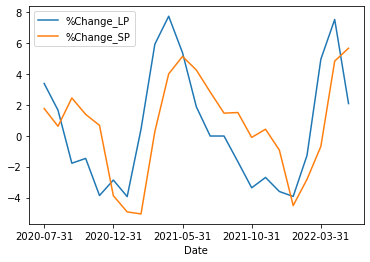

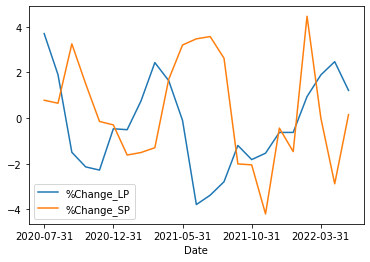

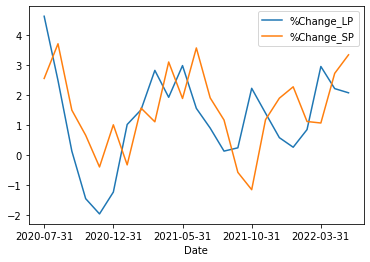

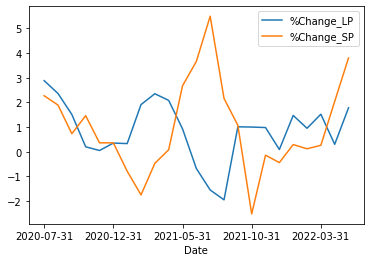

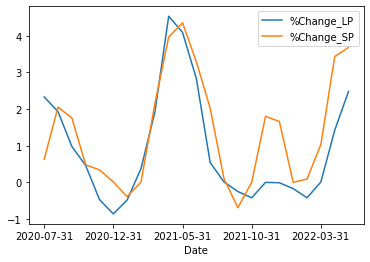

...

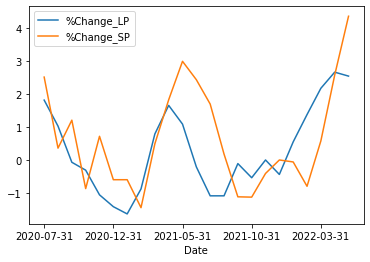

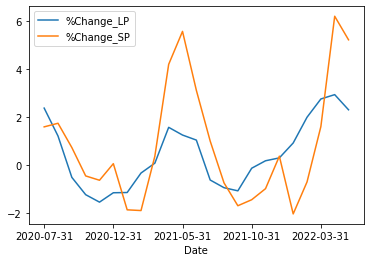

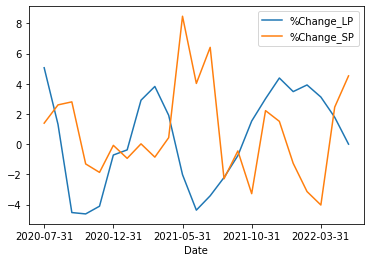

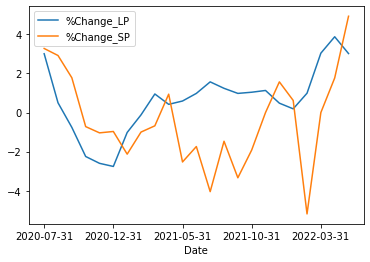

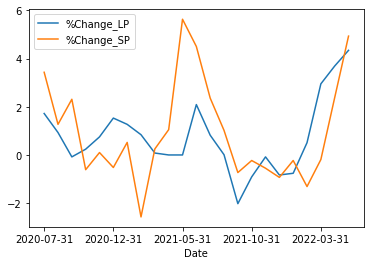

In [73]:
list_sale_data.groupby('City').plot(x='Date', y=['%Change_LP', '%Change_SP'])

In [74]:
# Merge hvi_by_month and rent_data_by_month dataframes
df = pd.merge(hvi_data, rent_data, how='left', on=['Date', 'City', 'State'])
df

,Date,City,State,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2020-07-31,New York,NY,489984.0,0.25,2663.0,-1.15
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,692496.0,0.25,2446.0,0.00
2,2020-07-31,Chicago,IL,245927.0,0.42,1723.0,-0.23
3,2020-07-31,Dallas-Fort Worth,TX,264380.0,0.40,1431.0,0.21
4,2020-07-31,Philadelphia,PA,259242.0,0.63,1590.0,0.06
...,...,...,...,...,...,...,...
15955,2022-06-30,Andrews,TX,221347.0,1.44,NaN,NaN
15956,2022-06-30,Zapata,TX,117079.0,0.85,NaN,NaN
15957,2022-06-30,Vermillion,SD,231123.0,1.12,NaN,NaN
15958,2022-06-30,Pecos,TX,190000.0,1.67,NaN,NaN


In [75]:
# Drop rows with NaN values
hvi_rent_data= df.dropna().reset_index(drop=True)
hvi_rent_data

,Date,City,State,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2020-07-31,New York,NY,489984.0,0.25,2663.0,-1.15
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,692496.0,0.25,2446.0,0.00
2,2020-07-31,Chicago,IL,245927.0,0.42,1723.0,-0.23
3,2020-07-31,Dallas-Fort Worth,TX,264380.0,0.40,1431.0,0.21
4,2020-07-31,Philadelphia,PA,259242.0,0.63,1590.0,0.06
...,...,...,...,...,...,...,...
2347,2022-06-30,Fort Collins,CO,588269.0,1.10,1874.0,1.02
2348,2022-06-30,Boulder,CO,822361.0,0.24,2221.0,0.09
2349,2022-06-30,College Station,TX,274681.0,1.73,1356.0,0.15
2350,2022-06-30,Gainesville,GA,378379.0,1.65,1652.0,1.54


In [76]:
# Merge hvi_by_month and rent_data_by_month dataframes
df = pd.merge(list_sale_data, hvi_rent_data, how='left', on=['Date', 'City', 'State'])
df

,Date,City,State,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2020-07-31,New York,NY,612596.0,1.71,444667.0,1.45,489984.0,0.25,2663.0,-1.15
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,927667.0,3.61,691333.0,2.17,692496.0,0.25,2446.0,0.00
2,2020-07-31,Chicago,IL,343800.0,2.07,257167.0,0.33,245927.0,0.42,1723.0,-0.23
3,2020-07-31,Dallas-Fort Worth,TX,354800.0,1.92,289967.0,1.56,264380.0,0.40,1431.0,0.21
4,2020-07-31,Philadelphia,PA,323333.0,3.85,274161.0,0.95,259242.0,0.63,1590.0,0.06
...,...,...,...,...,...,...,...,...,...,...,...
2157,2022-05-31,Daytona Beach,FL,399800.0,2.64,334000.0,1.93,349670.0,2.54,1883.0,1.24
2158,2022-05-31,Des Moines,IA,357468.0,0.19,276483.0,3.49,263210.0,0.82,1204.0,1.35
2159,2022-05-31,Provo,UT,684967.0,-0.25,538296.0,1.60,592047.0,1.60,1759.0,1.74
2160,2022-05-31,Durham,NC,531667.0,1.60,433417.0,4.86,426922.0,2.58,1669.0,1.95


In [77]:
housing_data = df.dropna().reset_index(drop=True)
housing_data

,Date,City,State,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2020-07-31,New York,NY,612596.0,1.71,444667.0,1.45,489984.0,0.25,2663.0,-1.15
1,2020-07-31,Los Angeles-Long Beach-Anaheim,CA,927667.0,3.61,691333.0,2.17,692496.0,0.25,2446.0,0.00
2,2020-07-31,Chicago,IL,343800.0,2.07,257167.0,0.33,245927.0,0.42,1723.0,-0.23
3,2020-07-31,Dallas-Fort Worth,TX,354800.0,1.92,289967.0,1.56,264380.0,0.40,1431.0,0.21
4,2020-07-31,Philadelphia,PA,323333.0,3.85,274161.0,0.95,259242.0,0.63,1590.0,0.06
...,...,...,...,...,...,...,...,...,...,...,...
1973,2022-05-31,Daytona Beach,FL,399800.0,2.64,334000.0,1.93,349670.0,2.54,1883.0,1.24
1974,2022-05-31,Des Moines,IA,357468.0,0.19,276483.0,3.49,263210.0,0.82,1204.0,1.35
1975,2022-05-31,Provo,UT,684967.0,-0.25,538296.0,1.60,592047.0,1.60,1759.0,1.74
1976,2022-05-31,Durham,NC,531667.0,1.60,433417.0,4.86,426922.0,2.58,1669.0,1.95


In [78]:
#output_path = 'Resources/housing_data.csv'
#housing_data.to_csv(output_path, index=False)

In [79]:
hvi_rent_data.hvplot.scatter(x='%Change_HVI', y='%Change_Rent')

:Scatter   [%Change_HVI]   (%Change_Rent)

<AxesSubplot:xlabel='City'>

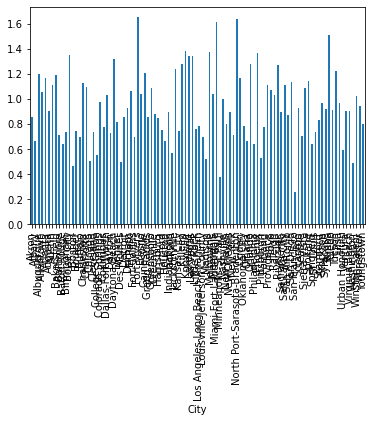

In [80]:
hvi_rent_data.groupby('City')['%Change_Rent'].mean().plot(kind='bar')


City
Akron             AxesSubplot(0.125,0.125;0.775x0.755)
Albany            AxesSubplot(0.125,0.125;0.775x0.755)
Albuquerque       AxesSubplot(0.125,0.125;0.775x0.755)
Allentown         AxesSubplot(0.125,0.125;0.775x0.755)
Atlanta           AxesSubplot(0.125,0.125;0.775x0.755)
                                  ...                 
Virginia Beach    AxesSubplot(0.125,0.125;0.775x0.755)
Washington        AxesSubplot(0.125,0.125;0.775x0.755)
Winston-Salem     AxesSubplot(0.125,0.125;0.775x0.755)
Worcester         AxesSubplot(0.125,0.125;0.775x0.755)
Youngstown        AxesSubplot(0.125,0.125;0.775x0.755)
Length: 98, dtype: object

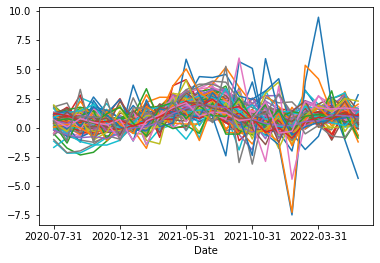

In [81]:
fig, ax = plt.subplots()
hvi_rent_data.groupby('City').plot(x='Date', y='%Change_Rent', ax=ax, legend=False)

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


City
Akron             AxesSubplot(0.125,0.125;0.775x0.755)
Albany            AxesSubplot(0.125,0.125;0.775x0.755)
Albuquerque       AxesSubplot(0.125,0.125;0.775x0.755)
Allentown         AxesSubplot(0.125,0.125;0.775x0.755)
Atlanta           AxesSubplot(0.125,0.125;0.775x0.755)
                                  ...                 
Virginia Beach    AxesSubplot(0.125,0.125;0.775x0.755)
Washington        AxesSubplot(0.125,0.125;0.775x0.755)
Winston-Salem     AxesSubplot(0.125,0.125;0.775x0.755)
Worcester         AxesSubplot(0.125,0.125;0.775x0.755)
Youngstown        AxesSubplot(0.125,0.125;0.775x0.755)
Length: 98, dtype: object

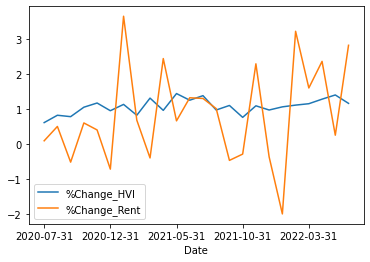

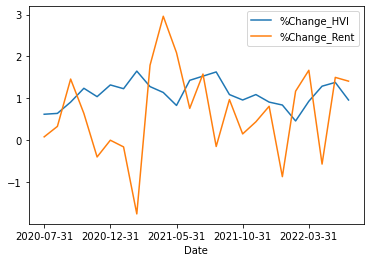

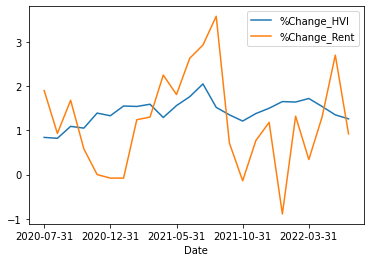

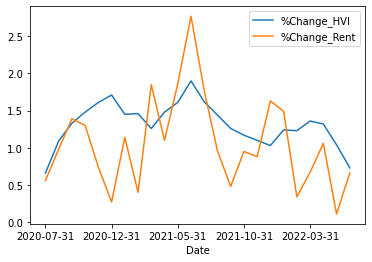

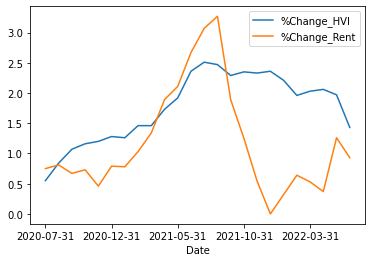

...

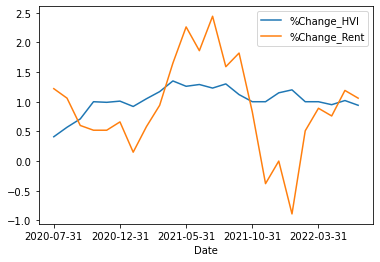

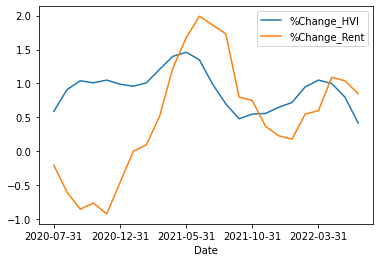

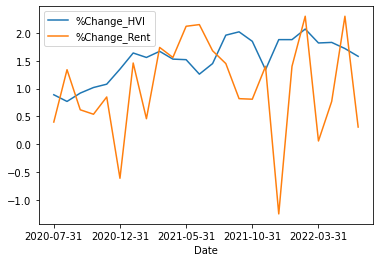

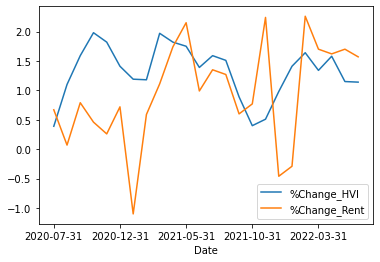

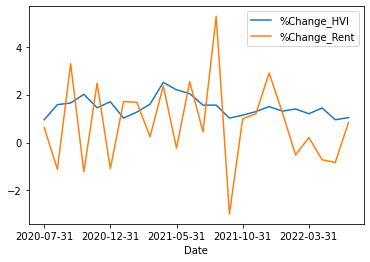

In [82]:
hvi_rent_data.groupby('City').plot(x='Date', y=['%Change_HVI', '%Change_Rent'])

## Machine Learning Tests


In [83]:
# Drop Date, City, State columns for machine learning dataframe
ml_cluster = housing_data.drop(columns=['Date', 'City', 'State'])
ml_cluster.head()

,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,612596.0,1.71,444667.0,1.45,489984.0,0.25,2663.0,-1.15
1,927667.0,3.61,691333.0,2.17,692496.0,0.25,2446.0,0.00
2,343800.0,2.07,257167.0,0.33,245927.0,0.42,1723.0,-0.23
3,354800.0,1.92,289967.0,1.56,264380.0,0.40,1431.0,0.21
4,323333.0,3.85,274161.0,0.95,259242.0,0.63,1590.0,0.06


In [84]:
# Test unsupervised machine learning model
from sklearn.cluster import KMeans

# Initialize instance of model
model = KMeans(n_clusters=2, random_state=5)

# Fit model
model.fit(ml_cluster)

# Get the predictions
predictions = model.predict(ml_cluster)
print(predictions)


[1 1 0 ... 1 1 1]


In [85]:
# Add class column to dataframe with predictions
ml_cluster['Class'] = model.labels_
ml_cluster.head()

,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent,Class
0,612596.0,1.71,444667.0,1.45,489984.0,0.25,2663.0,-1.15,1
1,927667.0,3.61,691333.0,2.17,692496.0,0.25,2446.0,0.00,1
2,343800.0,2.07,257167.0,0.33,245927.0,0.42,1723.0,-0.23,0
3,354800.0,1.92,289967.0,1.56,264380.0,0.40,1431.0,0.21,0
4,323333.0,3.85,274161.0,0.95,259242.0,0.63,1590.0,0.06,0


In [86]:
# Create a scatter plot of ml_hvi_rent
ml_cluster.hvplot.scatter(x='%Change_HVI', y='%Change_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [%Change_HVI]   (%Change_Rent)

In [87]:
# Scale data and fit to model
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

X_scaled = StandardScaler().fit_transform(ml_cluster)
X_scaled

array([[ 1.17970637,  0.35816432,  0.68027209, ...,  2.33805075,
        -2.12908496,  1.90019015],
       [ 3.0227075 ,  1.21738922,  2.29408145, ...,  1.85305292,
        -0.9542539 ,  1.90019015],
       [-0.39261013,  0.52096483, -0.54644441, ...,  0.2371385 ,
        -1.18922011, -0.52626312],
       ...,
       [ 1.603039  , -0.528194  ,  1.29283871, ...,  0.31759897,
         0.82331656,  1.90019015],
       [ 0.7063139 ,  0.30841972,  0.6066691 , ...,  0.11644779,
         1.03785093,  1.90019015],
       [ 0.87339256,  0.7289877 ,  1.4457432 , ...,  0.53216022,
         0.72115734,  1.90019015]])

In [88]:
# Initialize instance of model
model = KMeans(n_clusters=2, random_state=5)

model.fit(X_scaled)
predictions = model.predict(X_scaled)
print(predictions)

[0 0 1 ... 0 0 0]


In [89]:
ml_cluster['Class'] = model.labels_
ml_cluster.head()

,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent,Class
0,612596.0,1.71,444667.0,1.45,489984.0,0.25,2663.0,-1.15,0
1,927667.0,3.61,691333.0,2.17,692496.0,0.25,2446.0,0.00,0
2,343800.0,2.07,257167.0,0.33,245927.0,0.42,1723.0,-0.23,1
3,354800.0,1.92,289967.0,1.56,264380.0,0.40,1431.0,0.21,1
4,323333.0,3.85,274161.0,0.95,259242.0,0.63,1590.0,0.06,1


In [90]:
# Create a scatter plot of ml_hvi_rent
ml_cluster.hvplot.scatter(x='%Change_HVI', y='%Change_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [%Change_HVI]   (%Change_Rent)

In [91]:
# Create an elbow curve to find the best value for K.
inertia = []
k = list(range(1, 11))

for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(X_scaled)
    inertia.append(km.inertia_)
    
# Define DataFrame and plot the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks=k)

:Curve   [k]   (inertia)

In [92]:
# Initialize the K-Means model.
model = KMeans(n_clusters=3, random_state=1)

# Fit the model
model.fit(X_scaled)

# Predict clusters
predictions = model.predict(X_scaled)
predictions

array([2, 2, 1, ..., 2, 0, 2])

In [93]:
ml_cluster['Class'] = model.labels_
ml_cluster.head()

,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent,Class
0,612596.0,1.71,444667.0,1.45,489984.0,0.25,2663.0,-1.15,2
1,927667.0,3.61,691333.0,2.17,692496.0,0.25,2446.0,0.00,2
2,343800.0,2.07,257167.0,0.33,245927.0,0.42,1723.0,-0.23,1
3,354800.0,1.92,289967.0,1.56,264380.0,0.40,1431.0,0.21,1
4,323333.0,3.85,274161.0,0.95,259242.0,0.63,1590.0,0.06,1


In [95]:
# Create a scatter plot of ml_hvi_rent
ml_cluster.hvplot.scatter(x='%Change_HVI', y='%Change_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [%Change_HVI]   (%Change_Rent)

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
ml_data = housing_data.drop(columns=['Date', 'City', 'State'])
ml_data.head()

In [ ]:
ml_data.shape

In [ ]:
# Define Features set
X = ml_data.copy()
X = X.drop('%Change_Rent', axis=1)
X.head()

# Define Target Set
y = ml_data['%Change_Rent'].values.reshape(-1, 1)
y.shape

In [ ]:
# Split into testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

In [ ]:
# Creating a StandardScaler instance.
scaler = StandardScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [ ]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

In [ ]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)
# Plot Residuals
plt.scatter(predictions, predictions - y_test)
plt.hlines(y=0, xmin=predictions.min(), xmax=predictions.max())
plt.show()